In this notebook, I will generate windowed plots of north/south ancestry.

In [1]:
%run ../scripts/notebook_settings_lean.py
from scipy import stats
from horizonplot import horizonplot

In [2]:
def length_to_windows(length_df, pops, window_size=100000):
    #pops = sorted(length_df["reference"].unique())
    window_l = list(range(length_df.pos.values[0], length_df.end_pos.values[-1], window_size))
    overall_dict = {"windows": window_l}
    for p in pops:
        overall_dict[p] = np.zeros(len(window_l))
    for i in range(len(window_l)):
        w = window_l[i]
        # Finding all paintings that start in this window.
        s_df = length_df.loc[(length_df.pos >= w) & (length_df.pos < w+window_size)]
        for index, row in s_df.iterrows():
            # x decides how many windows it should go beyond the current.
            # if x==0, it both starts and ends in the same window
            x = (row.pos-w+row.length)//window_size
            if x == 0:
                overall_dict[row["reference"]][i] += int(row.length)
            # Otherwise, the current window is filled from row.pos to window end
            else:
                overall_dict[row["reference"]][i] += int((w+window_size)-row.pos)
                # Then iterated for each full window (which is all windows < x)
                for s in range(x-1):
                    overall_dict[row["reference"]][i+1+s] += int(window_size)
                # Then finally added the ending window
                # print(row.paint_length+row.pos, (w+x*window_size), x, w)
                overall_dict[row["reference"]][i+x] += int(row.length+row.pos-(w+x*window_size))
    df = pd.DataFrame(overall_dict)
    return df

def create_paint_df_ind(df, ind, mapping, ns_map):
    d = {}
    d["pos"] = df.spos
    d["end_pos"] = df.epos -1
    d["length"] = df.epos - df.spos
    d["reference"] = df[ind].map(mapping)
    d["n/s"] = d["reference"].map(ns_map)
    d["individual"] = ind[:-2]
    d["haplotype"] = ind[-1:]
    return pd.DataFrame(d)

In [3]:
meta_data_samples = pd.read_csv("../data/Papio_metadata_with_clustering.txt", sep =" ")

In [5]:
meta_data_samples.Origin.unique()

array(['Mikumi, Tanzania', 'Aberdare, Kenya', 'Chunga, Zambia', 'captive',
       'Awash, Ethiopia', 'Serengeti, Tanzania', 'Arusha, Tanzania',
       'Ngorongoro, Tanzania', 'Ruaha, Tanzania', 'Gombe, Tanzania',
       'Udzungwa, Tanzania', 'Mahale, Tanzania', 'Katavi, Tanzania',
       'Selous, Tanzania', 'Lake Manyara, Tanzania',
       'Tarangire, Tanzania', 'Niokolo-Koba, Senegal',
       'Issa Valley, Tanzania', 'Dendro Park, Zambia', 'Filoha, Ethiopia',
       'Gog Woreda, Gambella region, Ethiopia'], dtype=object)

In [8]:
[x.split(",")[0].split(" ")[0] for x in meta_data_samples.Origin.unique()]

['Mikumi',
 'Aberdare',
 'Chunga',
 'captive',
 'Awash',
 'Serengeti',
 'Arusha',
 'Ngorongoro',
 'Ruaha',
 'Gombe',
 'Udzungwa',
 'Mahale',
 'Katavi',
 'Selous',
 'Lake',
 'Tarangire',
 'Niokolo-Koba',
 'Issa',
 'Dendro',
 'Filoha',
 'Gog']

In [3]:
meta_data_samples_Sci = meta_data_samples.copy()
for i, row in meta_data_samples_Sci.iterrows():
    if row.PGDP_ID[0] != "P":
        meta_data_samples_Sci.at[i, "PGDP_ID"] = "Sci_"+str(row.PGDP_ID)

In [ ]:
meta_data_samples_Sci.to_csv("../data/Papio_metadata_with_clustering.txt", sep =" ", index=False)

In [4]:
rfmix_path = "/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_all/"
north_south_mapping = {'Hamadryas, Ethiopia': 1, 'Papio, Senegal': 1, 'Kindae, Zambia': 0, 'Ursinus, Zambia': 0}

In [6]:
df_l = []
for chrom in list(range(4, 21)): #+["X"]:
    input_file = rfmix_path + "chr{}.msp.tsv".format(chrom)
    chr_df = pd.read_csv(input_file, sep = "\t", header=1)
    file = open(input_file, 'r')
    line1 = file.readline()
    file.close()
    number_subpop_mapping = {}
    for subpop in line1.strip().split("\t"):
        # Splitting to create lists containing two values - subpop and number.
        subpop_number = subpop.split(": ")[-1].split("=")
        number_subpop_mapping[int(subpop_number[1])] = subpop_number[0]
    for hap in chr_df.columns[6:]:
        paint_df = create_paint_df_ind(chr_df, hap, number_subpop_mapping, north_south_mapping)
        paint_df["chrom"] = "chr{}".format(chrom)
        df_l.append(paint_df)
length_df = pd.concat(df_l)

In [10]:
window_df_l = []
for chrom in []:# list(range(4, 21)): #+["X"]:
    chrom_df = length_df.loc[length_df.chrom == "chr{}".format(chrom)]
    pops = chrom_df.reference.unique()
    for ind in chrom_df.individual.unique():
        ind_df = chrom_df.loc[chrom_df.individual == ind]
        window_df_ind = length_to_windows(ind_df, pops)
        window_df_ind["chrom"] = "chr{}".format(chrom)
        window_df_ind["individual"] = ind
        window_df_l.append(window_df_ind)
#window_df = pd.concat(window_df_l)

In [ ]:
window_df["Origin"] = window_df.individual.map(dict(zip(meta_data_samples_Sci.PGDP_ID, meta_data_samples_Sci.Origin)))

In [ ]:
window_df["north"] = window_df["Hamadryas, Ethiopia"]+window_df["Papio, Senegal"]
window_df["norm_north"] = (window_df.north-window_df.iloc[:,1:5].sum(axis=1)/2)
window_df["start"] = window_df["windows"]

Saving the df

In [ ]:
#window_df.to_csv("../steps/rfmix_v2_windowed_df.txt", index=False)

Loading the df

In [3]:
window_df = pd.read_csv("../steps/rfmix_v2_windowed_df.txt")

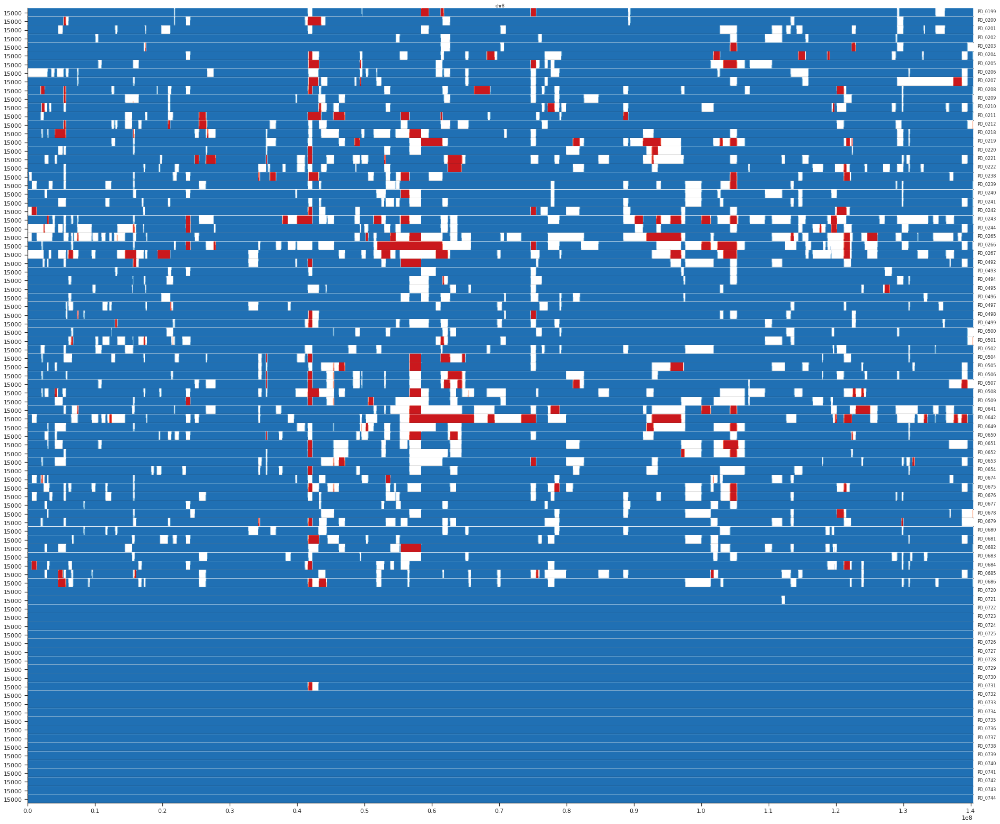

In [12]:
anubis = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.Species
                                                                     == "anubis"].PGDP_ID)]
chr8 = anubis.loc[anubis.chrom == "chr8"]
fig = horizonplot(chr8, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/Chr8_anubis_tanzania.png", dpi=100, format="png")

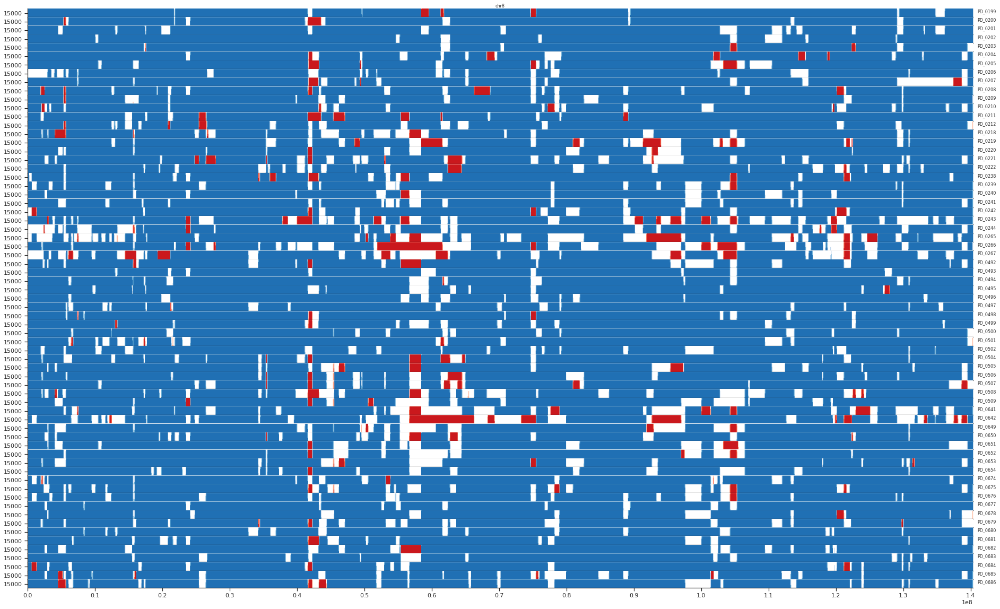

In [13]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Anubis, Tanzania"].PGDP_ID)]
chr8 = input_subset.loc[input_subset.chrom == "chr8"]
fig = horizonplot(chr8, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/Chr8_anubis_tanzania.png", dpi=100, format="png")

In [ ]:
meta_data_samples.C_origin.unique()

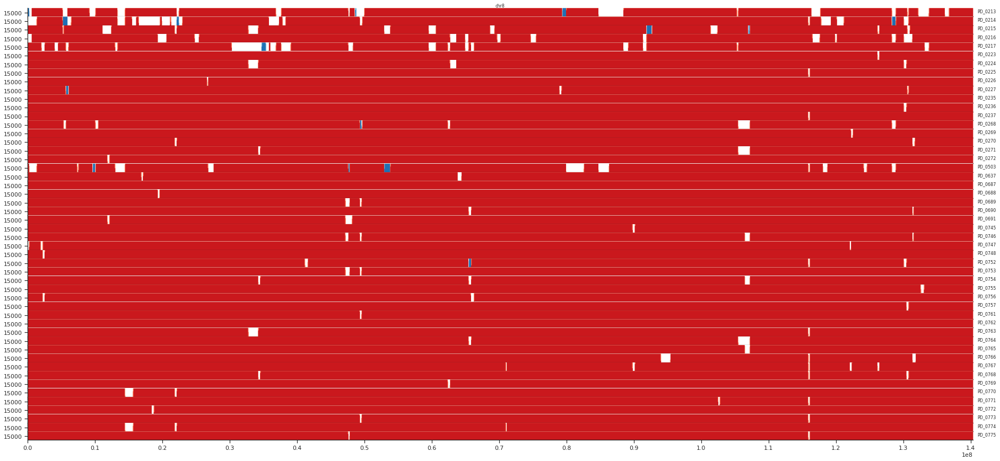

In [14]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
chr8 = input_subset.loc[input_subset.chrom == "chr8"]
fig = horizonplot(chr8, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/Chr8_yellow_tanzania.png", dpi=100, format="png")

4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


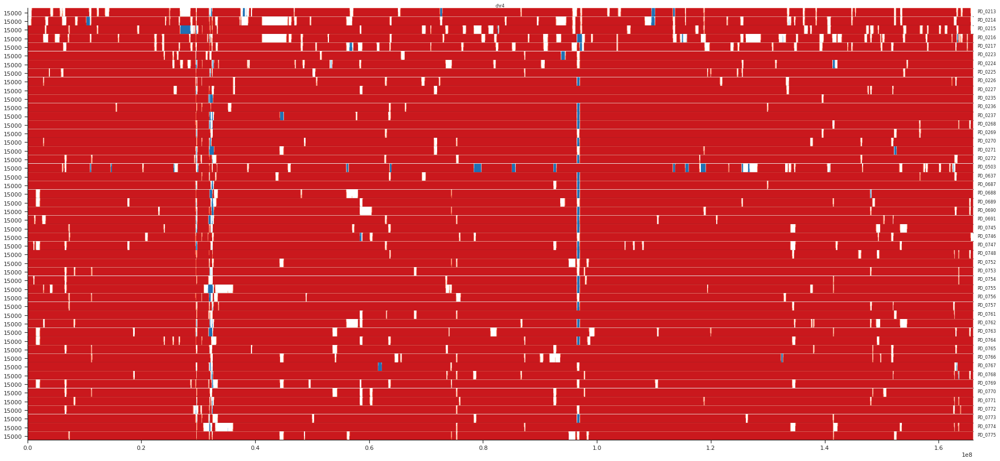

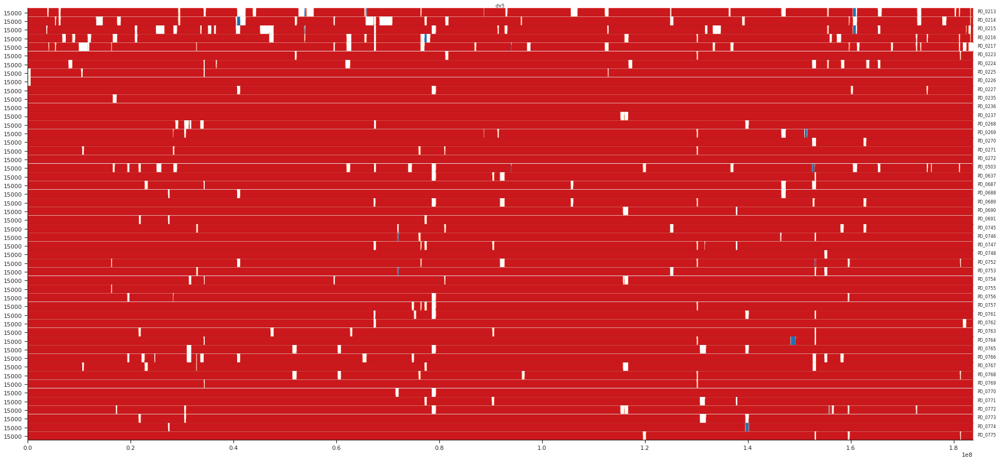

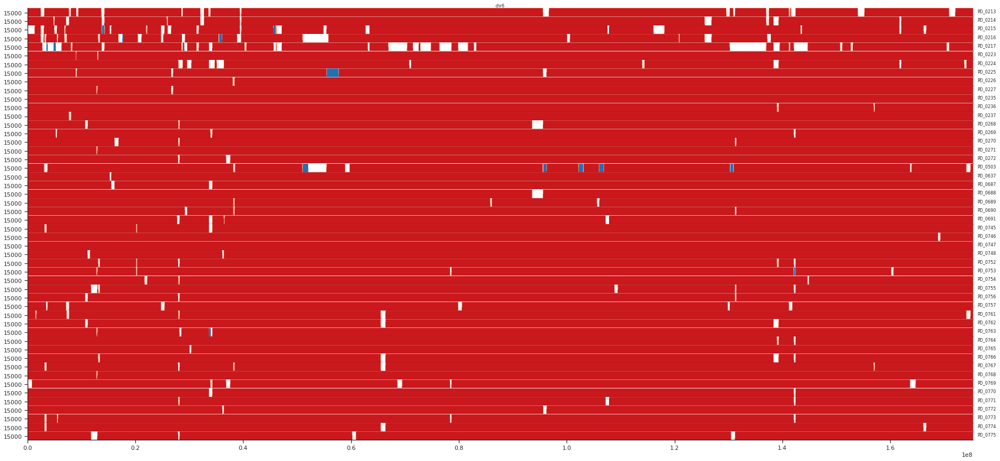

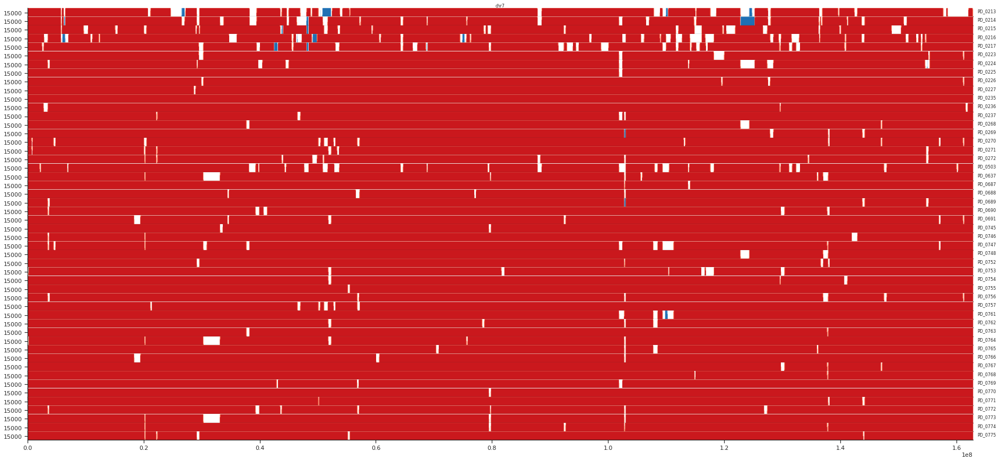

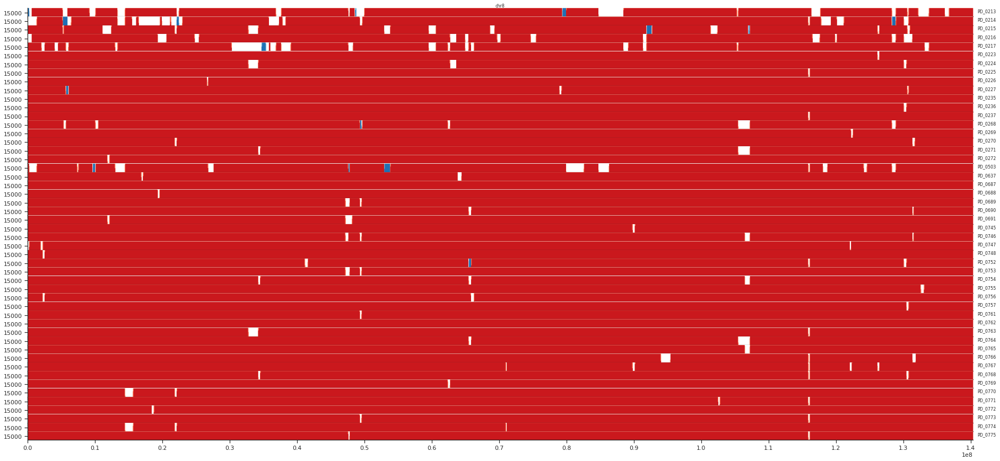

...

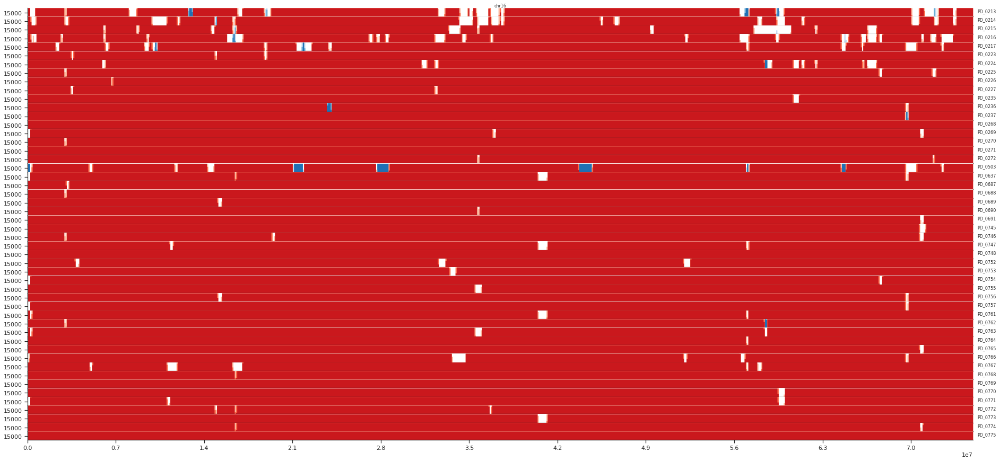

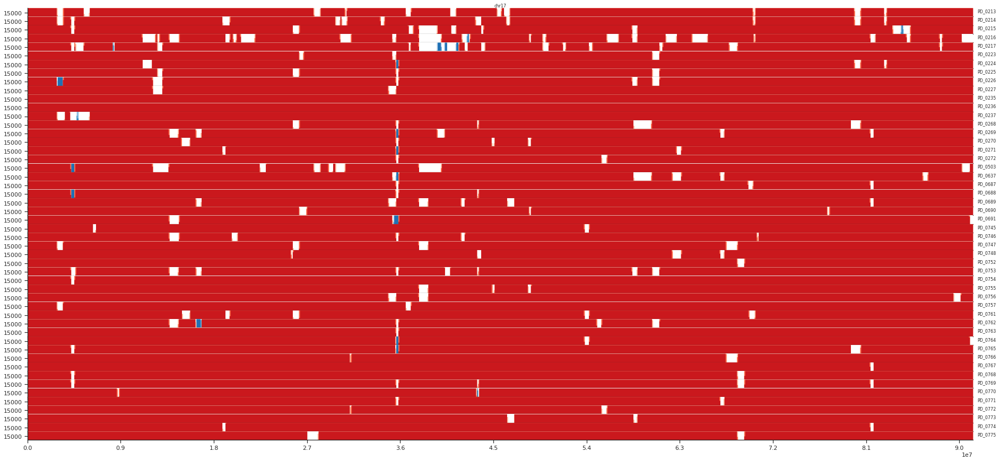

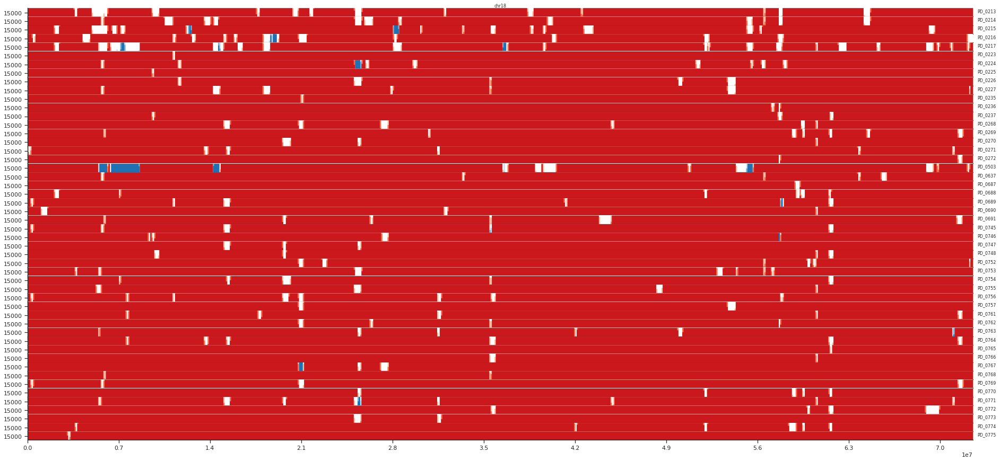

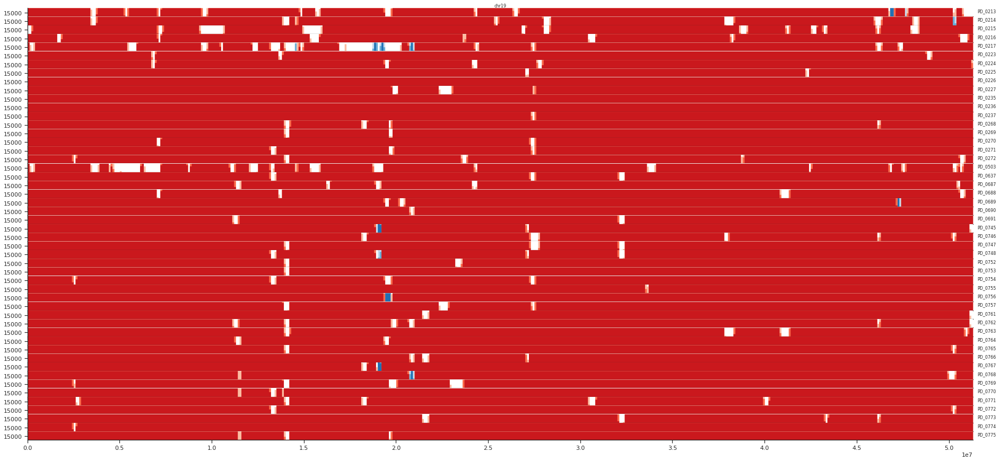

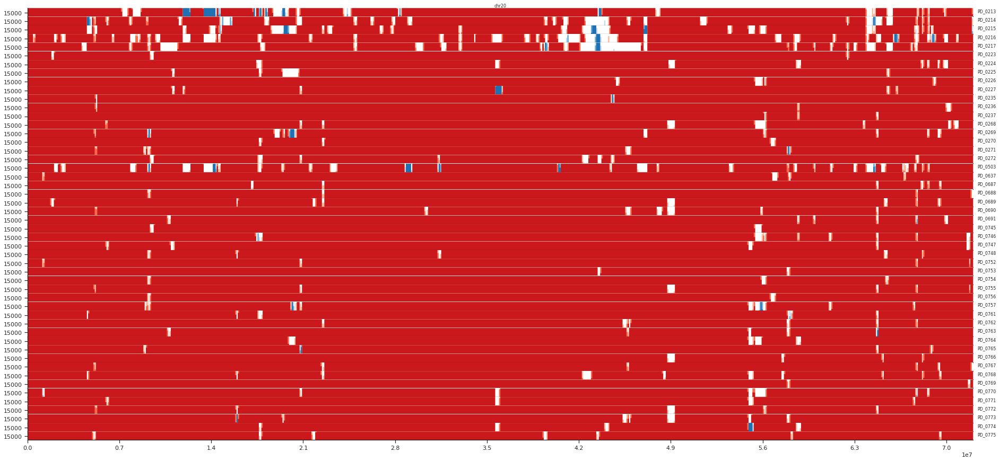

In [15]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
for chrom in list(range(4, 21)): #+["X"]:
    print(chrom)
    sub_chr = input_subset.loc[input_subset.chrom == "chr{}".format(chrom)]
    fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
    fig.savefig("../steps/paint_plots/Chr{}_yellow_tanzania.png".format(chrom), dpi=100, format="png")

4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


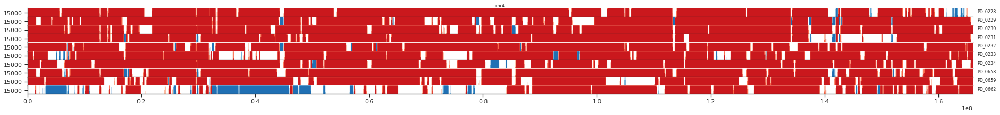

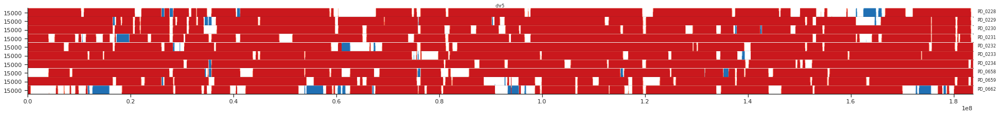

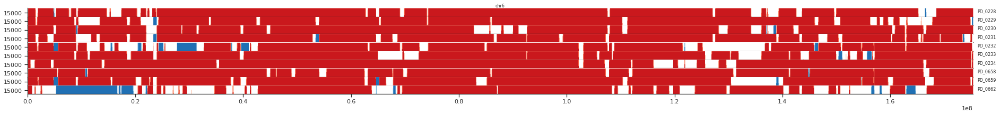

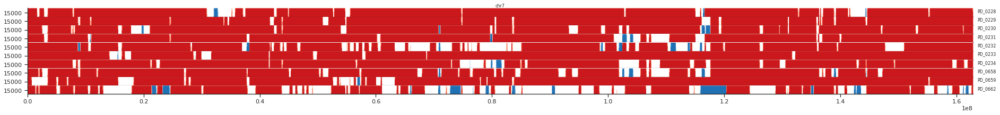

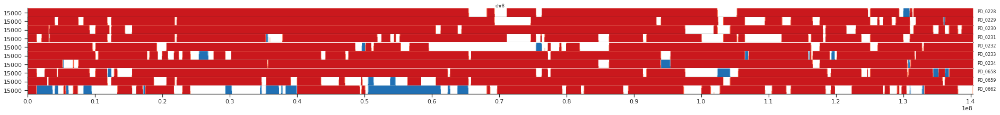

...

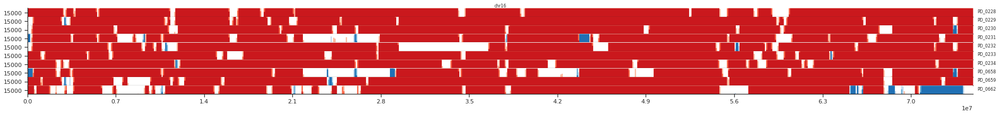

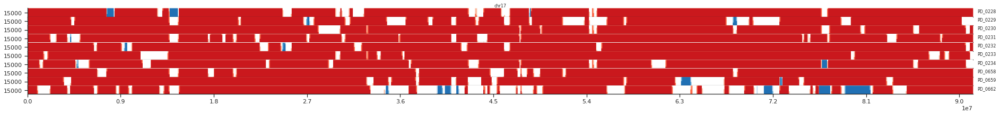

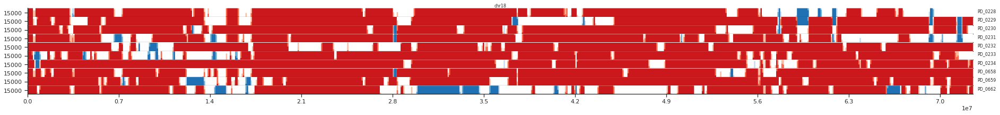

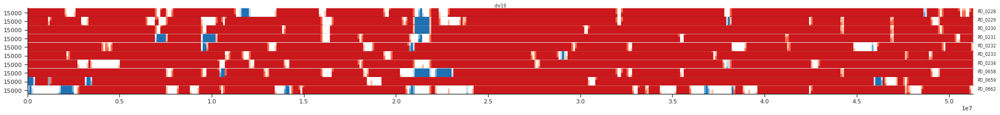

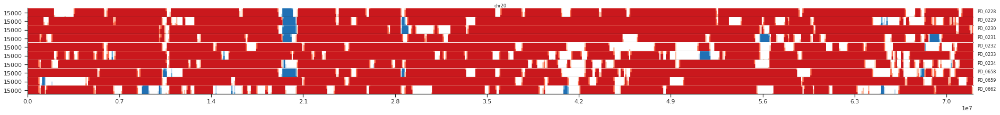

In [16]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Western Tanzania"].PGDP_ID)]
for chrom in list(range(4, 21)): #+["X"]:
    print(chrom)
    sub_chr = input_subset.loc[input_subset.chrom == "chr{}".format(chrom)]
    fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
    fig.savefig("../steps/paint_plots/Chr{}_western_yellow_tanzania.png".format(chrom), dpi=100, format="png")

4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


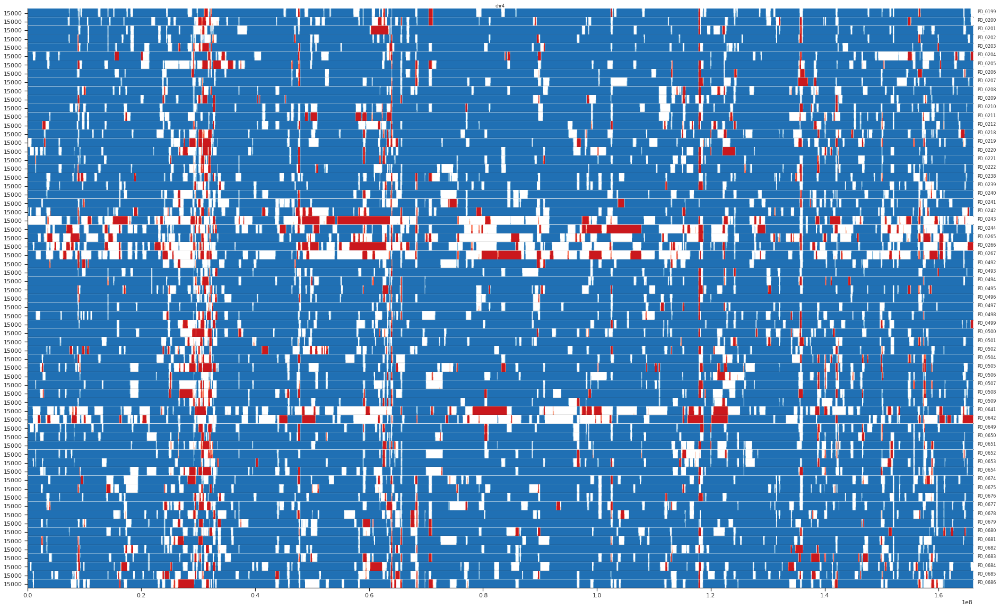

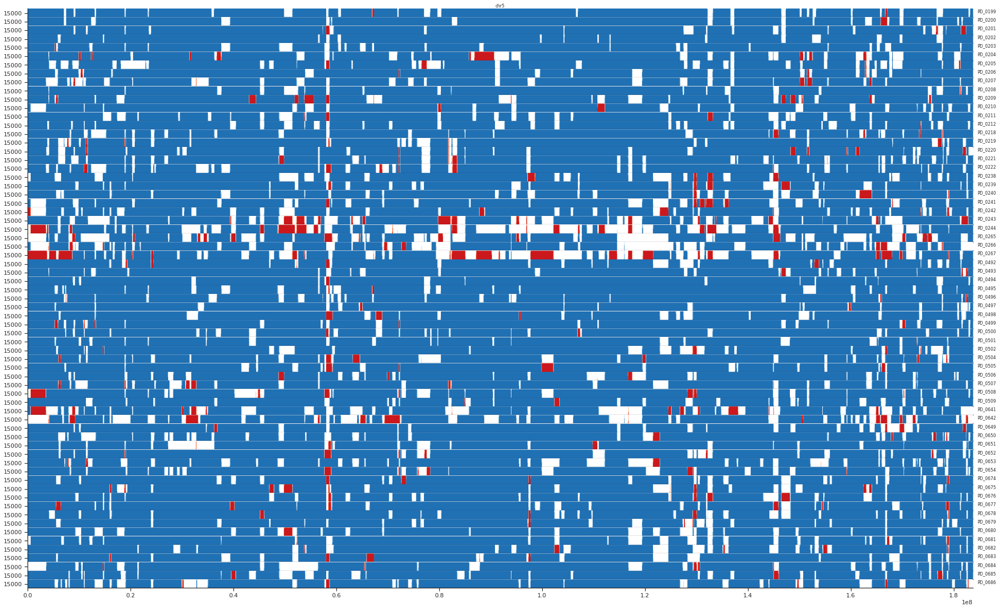

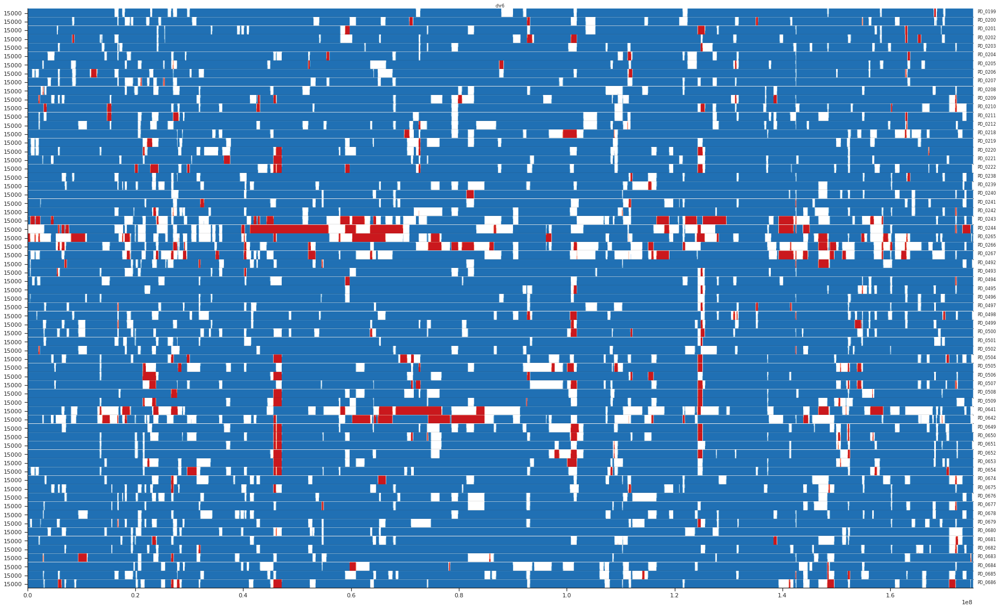

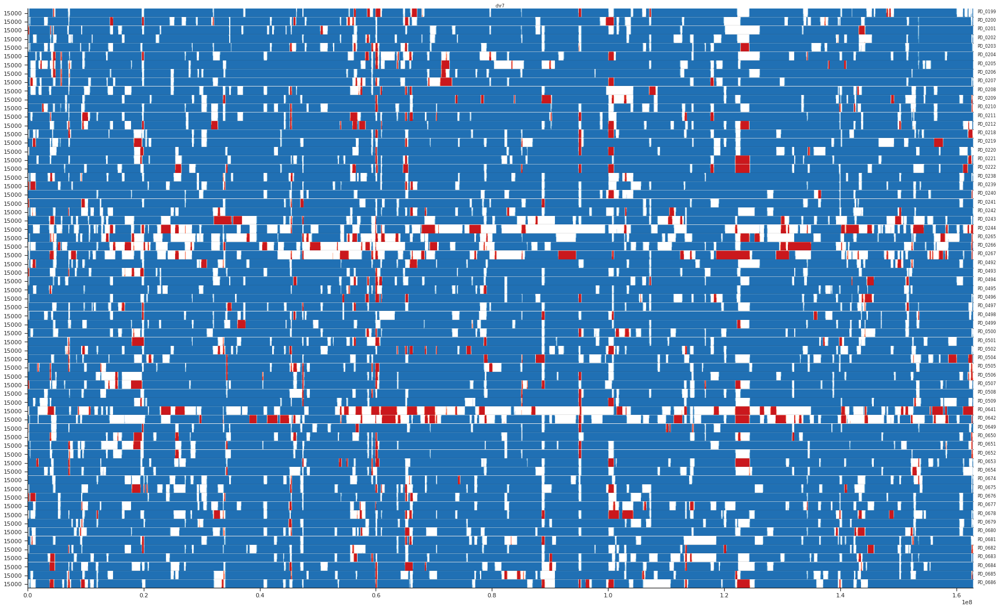

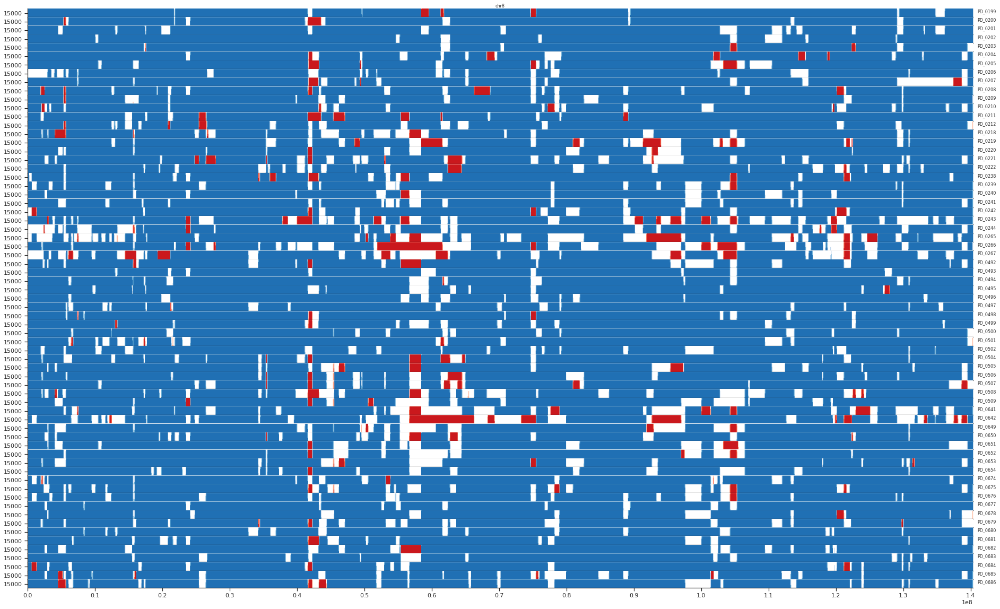

...

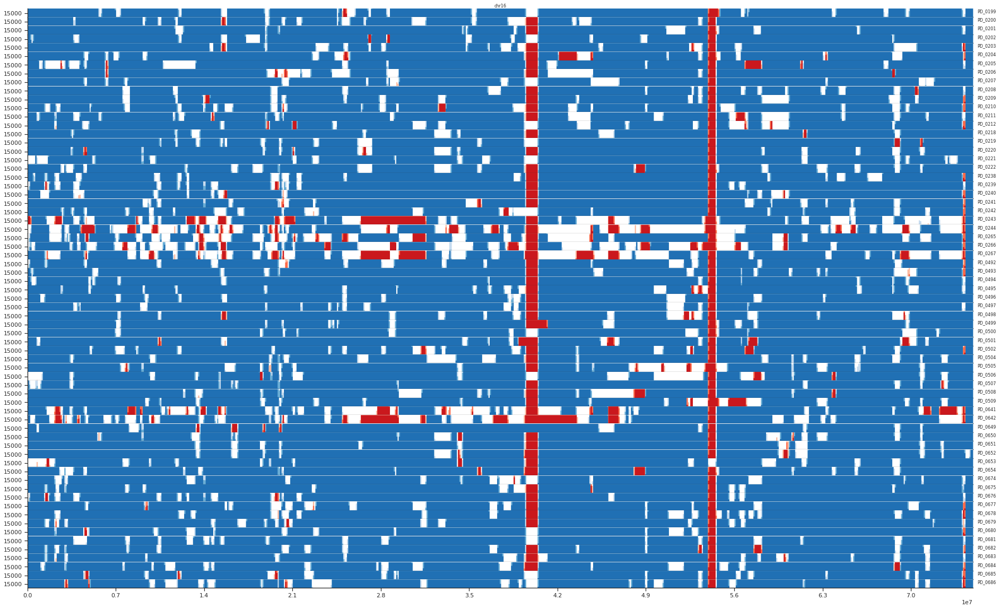

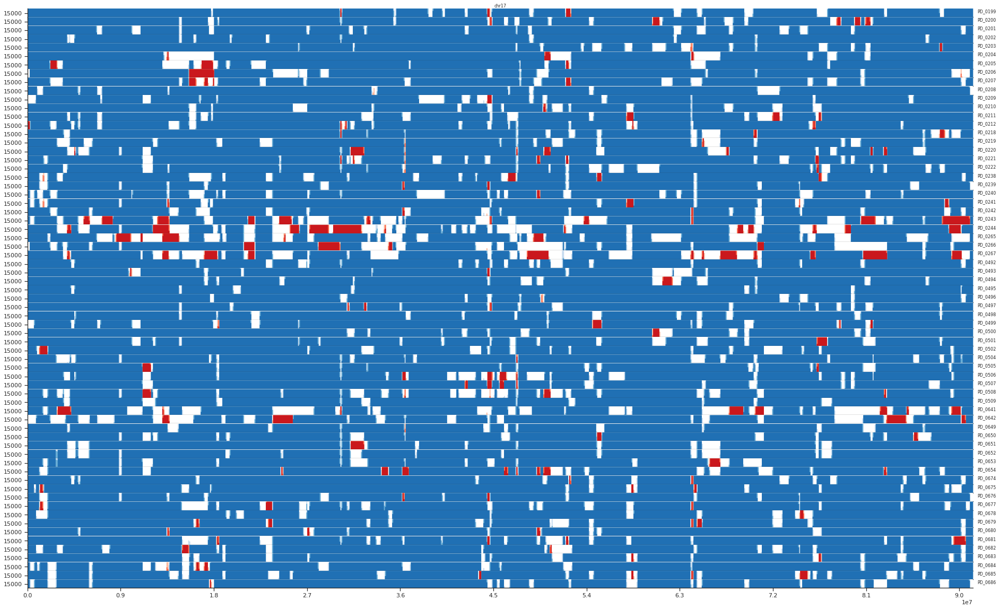

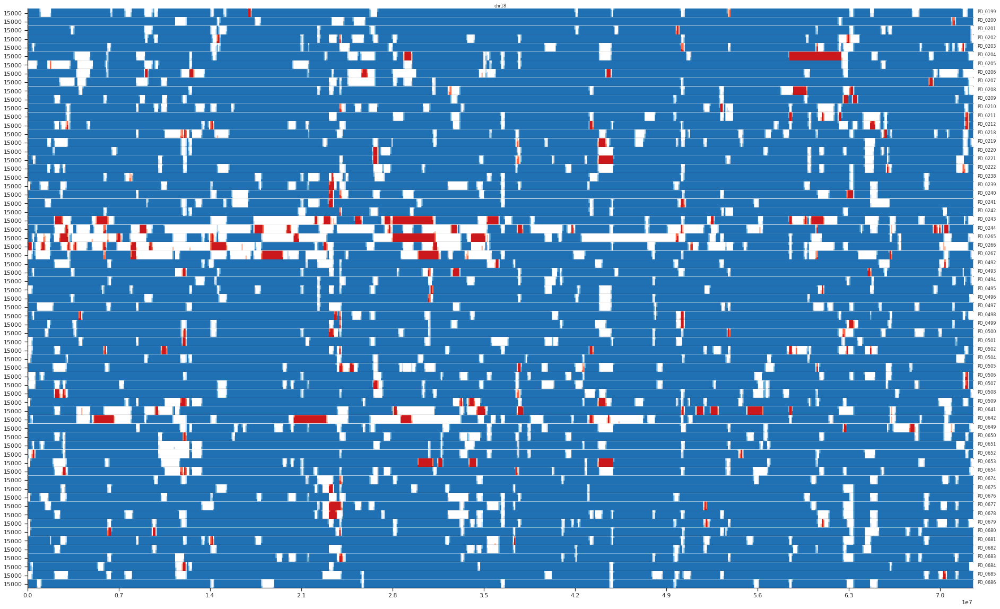

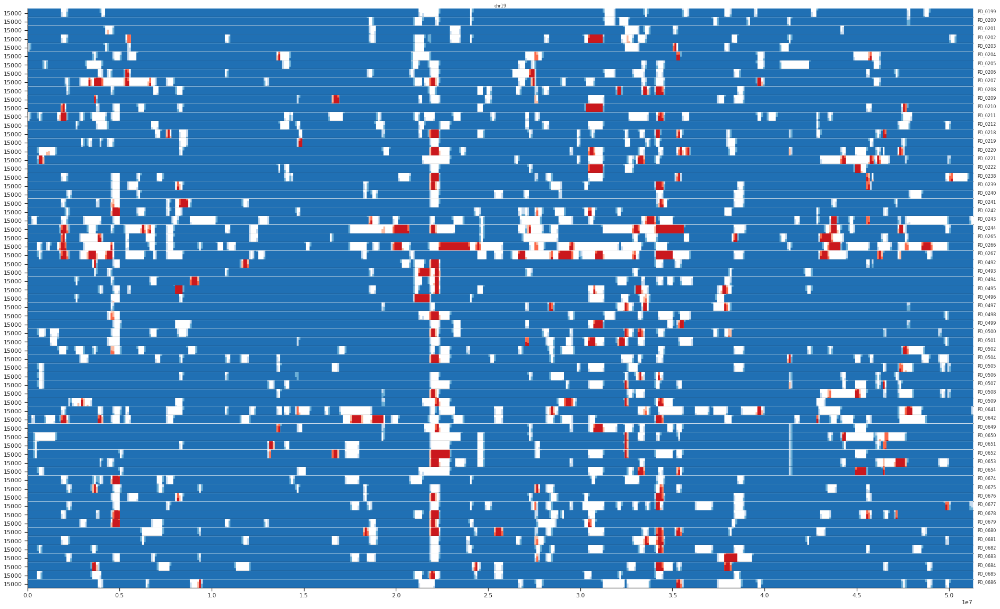

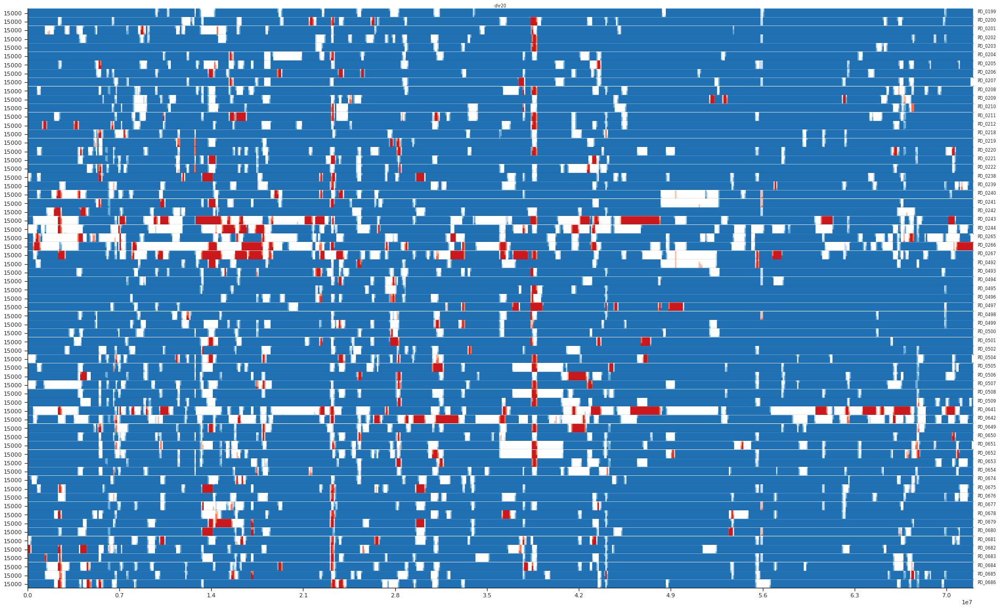

In [6]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Anubis, Tanzania"].PGDP_ID)]
for chrom in list(range(4, 21)): #+["X"]:
    print(chrom)
    sub_chr = input_subset.loc[input_subset.chrom == "chr{}".format(chrom)]
    fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
    fig.savefig("../steps/paint_plots/Chr{}_anubis_tanzania.png".format(chrom), dpi=100, format="png")

ChrX checks

In [6]:
window_df = pd.read_csv("../steps/rfmix_v1_windowed_df.txt")

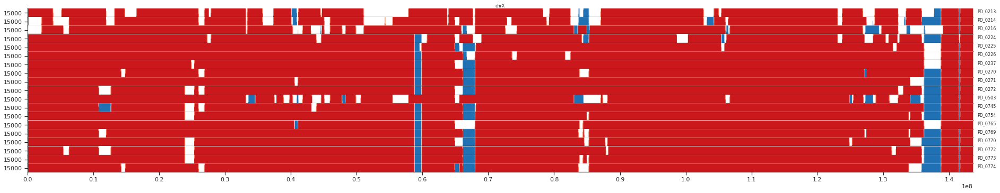

In [8]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/ChrX_yellow_tanzania.png", dpi=100, format="png")

In [12]:
meta_data_samples.loc[meta_data_samples.C_origin  == "Cynocephalus, Central Tanzania"]

,PGDP_ID,Provider_ID,Provider,Genus,Species,Origin,Sex,address,longitude,latitude,callset_index,C_origin
0,16066,16066_3130,Rogers,Papio,cynocephalus,"Mikumi, Tanzania",F,"Mikumi, Kilosa, Morogoro, Coastal Zone, Tanzania",36.977032,-7.404852,0,"Cynocephalus, Central Tanzania"
1,16098,16098_5026,Rogers,Papio,cynocephalus,"Mikumi, Tanzania",F,"Mikumi, Kilosa, Morogoro, Coastal Zone, Tanzania",36.977032,-7.404852,1,"Cynocephalus, Central Tanzania"
24,PD_0213,07RUF1090716,Knauf/Chuma/Roos,Papio,cynocephalus,"Ruaha, Tanzania",F,"Ruaha, Ulanga, Morogoro, Coastal Zone, Tanzania",36.714814,-8.895386,24,"Cynocephalus, Central Tanzania"
25,PD_0214,09RUF1100716,Knauf/Chuma/Roos,Papio,cynocephalus,"Ruaha, Tanzania",F,"Ruaha, Ulanga, Morogoro, Coastal Zone, Tanzania",36.714814,-8.895386,25,"Cynocephalus, Central Tanzania"
26,PD_0215,13RUM1130716,Knauf/Chuma/Roos,Papio,cynocephalus,"Ruaha, Tanzania",M,"Ruaha, Ulanga, Morogoro, Coastal Zone, Tanzania",36.714814,-8.895386,26,"Cynocephalus, Central Tanzania"
27,PD_0216,16RUF8140716,Knauf/Chuma/Roos,Papio,cynocephalus,"Ruaha, Tanzania",F,"Ruaha, Ulanga, Morogoro, Coastal Zone, Tanzania",36.714814,-8.895386,27,"Cynocephalus, Central Tanzania"
28,PD_0217,17RUM5140716,Knauf/Chuma/Roos,Papio,cynocephalus,"Ruaha, Tanzania",M,"Ruaha, Ulanga, Morogoro, Coastal Zone, Tanzania",36.714814,-8.895386,28,"Cynocephalus, Central Tanzania"
34,PD_0223,02UNM1220616,Knauf/Chuma/Roos,Papio,cynocephalus,"Udzungwa, Tanzania",M,"Udzungwa National Park, Iringa, Southern Highl...",36.725746,-7.805251,34,"Cynocephalus, Central Tanzania"
35,PD_0224,23UNF1120317,Knauf/Chuma/Roos,Papio,cynocephalus,"Udzungwa, Tanzania",F,"Udzungwa National Park, Iringa, Southern Highl...",36.725746,-7.805251,35,"Cynocephalus, Central Tanzania"
36,PD_0225,24UNF1150317,Knauf/Chuma/Roos,Papio,cynocephalus,"Udzungwa, Tanzania",F,"Udzungwa National Park, Iringa, Southern Highl...",36.725746,-7.805251,36,"Cynocephalus, Central Tanzania"


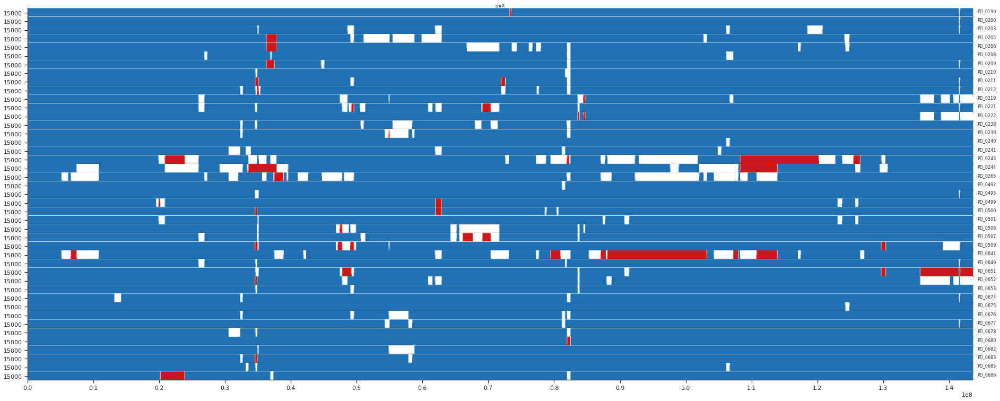

In [39]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Anubis, Tanzania"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/ChrX_anubis_tanzania.png", dpi=100, format="png")

Work on windowed df

In [4]:
window_df = pd.read_csv("../steps/rfmix_v2_windowed_df.txt")

In [5]:

meta_data_samples = pd.read_csv("../data/Papio_metadata_with_clustering.txt", sep =" ")
meta_data_samples_Sci = meta_data_samples.copy()
for i, row in meta_data_samples_Sci.iterrows():
    if row.PGDP_ID[0] != "P":
        meta_data_samples_Sci.at[i, "PGDP_ID"] = "Sci_"+str(row.PGDP_ID)

rfmix_path = "/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_all/"
north_south_mapping = {'Hamadryas, Ethiopia': 1, 'Papio, Senegal': 1, 'Kindae, Zambia': 0, 'Ursinus, Zambia': 0}

In [6]:
eastern_yellow_IDs = meta_data_samples_Sci.loc[meta_data_samples_Sci.C_origin ==
                                               "Cynocephalus, Western Tanzania"].PGDP_ID
tarangire_IDs = meta_data_samples_Sci.loc[meta_data_samples_Sci.Origin ==
                                               "Tarangire, Tanzania"].PGDP_ID
serengeti_IDs = meta_data_samples_Sci.loc[meta_data_samples_Sci.Origin ==
                                               "Serengeti, Tanzania"].PGDP_ID
ruaha_IDs = meta_data_samples_Sci.loc[meta_data_samples_Sci.Origin ==
                                               "Ruaha, Tanzania"].PGDP_ID

In [7]:
eastern_yellows = window_df.loc[window_df.individual.isin(eastern_yellow_IDs)].groupby(["chrom","start"]).mean().reset_index()
tarangire = window_df.loc[window_df.individual.isin(tarangire_IDs)].groupby(["chrom","start"]).mean().reset_index()
serengeti = window_df.loc[window_df.individual.isin(serengeti_IDs)].groupby(["chrom","start"]).mean().reset_index()
ruaha = window_df.loc[window_df.individual.isin(ruaha_IDs)].groupby(["chrom","start"]).mean().reset_index()

In [8]:
stats.spearmanr(eastern_yellows["north"], tarangire["north"])

SpearmanrResult(correlation=0.036545455938328565, pvalue=2.2291229591655494e-07)

<AxesSubplot:xlabel='north', ylabel='Count'>

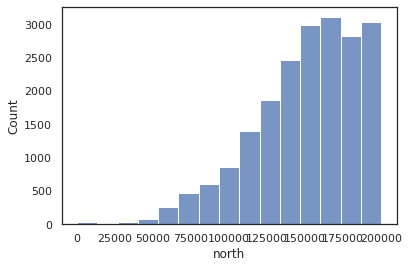

In [9]:
sns.histplot(tarangire["north"], bins=15)

In [11]:
input_df = window_df

recomb_map_path = "/home/eriks/baboondiversity/data/PG_panu3_recombination_map/ldhat_conversion_{}_updated.txt"
window_size = 100000
df_l = []
for chrom in window_df.chrom.unique():
    print(chrom)
    windows_length = {}
    input_temp = input_df.loc[input_df.chrom == chrom]
    recomb_map = pd.read_csv(recomb_map_path.format(chrom), sep=" ")
    windows = sorted(input_temp["windows"].unique())
    for window in windows[:-1]:
        windows_length[window] =(recomb_map.loc[recomb_map.position >= window+window_size]["Genetic_Map(cM)"].iloc[0]-
                                 recomb_map.loc[recomb_map.position >= window]["Genetic_Map(cM)"].iloc[0])
    windows_length[windows[-1]] = (recomb_map["Genetic_Map(cM)"].iloc[-2] - 
                            recomb_map.loc[recomb_map.position >= window]["Genetic_Map(cM)"].iloc[0])
    input_temp["cM"] = input_temp["windows"].map(windows_length)
    df_l.append(input_temp)
recomb_df = pd.concat(df_l)

chr4


/home/eriks/miniconda3/envs/baboondiversity/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


chr5
chr6
chr7
chr8
chr9
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr20


In [28]:
recomb_df["percent_north"] = recomb_df["north"]/(recomb_df.iloc[:,1:5].sum(axis=1))
input_df = recomb_df.groupby(["Origin", "chrom", "windows"]).mean().reset_index()
df_l = []
for chrom in recomb_df.chrom.unique():
    df_temp = input_df.loc[input_df.chrom == chrom]
    bins = 20
    df_temp["recomb_group"] = pd.qcut(df_temp["cM"], bins, labels=False, duplicates="drop")
    df_l.append(df_temp)
df_all = pd.concat(df_l)

/home/eriks/miniconda3/envs/baboondiversity/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


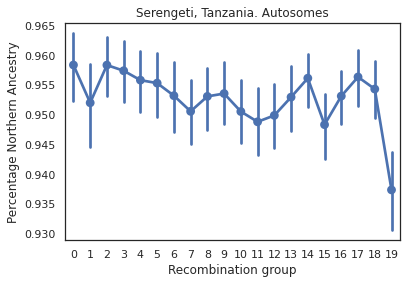

In [29]:
df = df_all.loc[(df_all["Origin"] == "Serengeti, Tanzania")]
g = sns.pointplot(data=df, y="percent_north", x="recomb_group", ci=95)
g.set(title="Serengeti, Tanzania. Autosomes")
g.set(xlabel="Recombination group", ylabel="Percentage Northern Ancestry")
plt.savefig("../figures/Serengeti_autosomes_recomb.png", dpi=300, bbox_inches='tight')

In [30]:
df = df_all.loc[(df_all["Origin"] == "Tarangire, Tanzania")]
df = df.loc[df.percent_north >= 0.5]
df

,Origin,chrom,windows,"Kindae, Zambia","Hamadryas, Ethiopia","Ursinus, Zambia","Papio, Senegal",north,norm_north,start,cM,percent_north,recomb_group
271478,"Tarangire, Tanzania",chr4,425,14285.714286,185714.285714,0.0,0.0,185714.285714,85714.285714,425.0,0.034903,0.928571,5
271479,"Tarangire, Tanzania",chr4,100425,14285.714286,185714.285714,0.0,0.0,185714.285714,85714.285714,100425.0,0.047875,0.928571,7
271480,"Tarangire, Tanzania",chr4,200425,14285.714286,185714.285714,0.0,0.0,185714.285714,85714.285714,200425.0,0.056583,0.928571,8
271481,"Tarangire, Tanzania",chr4,300425,14285.714286,185714.285714,0.0,0.0,185714.285714,85714.285714,300425.0,0.011550,0.928571,1
271482,"Tarangire, Tanzania",chr4,400425,14285.714286,185714.285714,0.0,0.0,185714.285714,85714.285714,400425.0,0.047499,0.928571,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
271473,"Tarangire, Tanzania",chr20,71600019,32907.428571,167092.571429,0.0,0.0,167092.571429,67092.571429,71600019.0,0.056506,0.835463,6
271474,"Tarangire, Tanzania",chr20,71700019,29776.714286,170223.285714,0.0,0.0,170223.285714,70223.285714,71700019.0,0.071545,0.851116,8
271475,"Tarangire, Tanzania",chr20,71800019,42857.142857,157142.857143,0.0,0.0,157142.857143,57142.857143,71800019.0,0.087090,0.785714,9
271476,"Tarangire, Tanzania",chr20,71900019,42857.142857,157142.857143,0.0,0.0,157142.857143,57142.857143,71900019.0,0.149607,0.785714,14


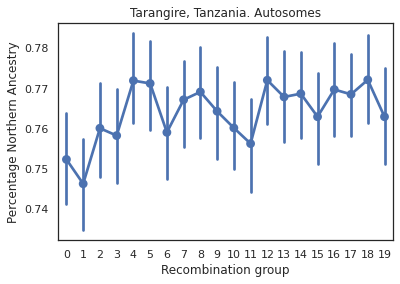

In [31]:
df = df_all.loc[(df_all["Origin"] == "Tarangire, Tanzania")]
g = sns.pointplot(data=df, y="percent_north", x="recomb_group", ci=95)
g.set(title="Tarangire, Tanzania. Autosomes")
g.set(xlabel="Recombination group", ylabel="Percentage Northern Ancestry")
plt.savefig("../figures/tarangire_boxplot_autosomes_recomb.png", dpi=300, bbox_inches='tight')

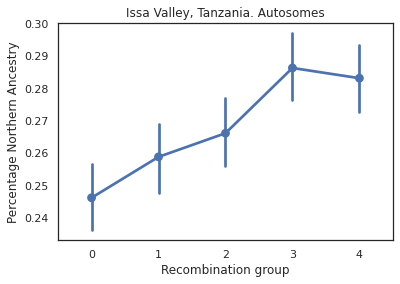

In [142]:
df = df_all.loc[df_all["Origin"] == "Issa Valley, Tanzania"]
g = sns.pointplot(data=df, y="percent_north", x="recomb_group", ci=95)
g.set(title="Issa Valley, Tanzania. Autosomes")
g.set(xlabel="Recombination group", ylabel="Percentage Northern Ancestry")
plt.savefig("../figures/issa_autosomes_recomb.png", dpi=300, bbox_inches='tight')

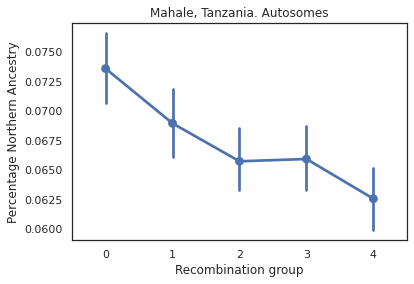

In [143]:
df = df_all.loc[df_all["Origin"] == "Mahale, Tanzania"]
g = sns.pointplot(data=df, y="percent_north", x="recomb_group", ci=95)
g.set(title="Mahale, Tanzania. Autosomes")
g.set(xlabel="Recombination group", ylabel="Percentage Northern Ancestry")
plt.savefig("../figures/mahale_autosomes_recomb.png", dpi=300, bbox_inches='tight')

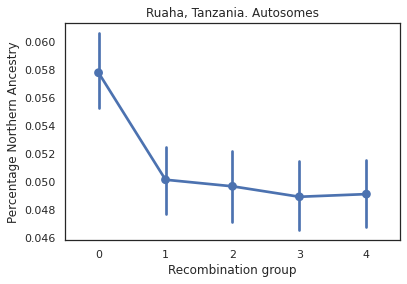

In [144]:
df = df_all.loc[df_all["Origin"] == "Ruaha, Tanzania"]
g = sns.pointplot(data=df, y="percent_north", x="recomb_group", ci=95)
g.set(title="Ruaha, Tanzania. Autosomes")
g.set(xlabel="Recombination group", ylabel="Percentage Northern Ancestry")
plt.savefig("../figures/ruaha_autosomes_recomb.png", dpi=300, bbox_inches='tight')

A test run wherein I look at the rfmix_females_gen50 test run.

In [4]:
meta_data_samples = pd.read_csv("../data/Papio_metadata_with_clustering.txt", sep =" ")
rfmix_path = "/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_females_gen50/"
north_south_mapping = {'Hamadryas, Ethiopia': 1, 'Papio, Senegal': 1, 'Kindae, Zambia': 0, 'Ursinus, Zambia': 0}

In [5]:
df_l = []
for chrom in list(range(18, 21)) + ["X"]:
    input_file = rfmix_path + "chr{}.msp.tsv".format(chrom)
    chr_df = pd.read_csv(input_file, sep = "\t", header=1)
    file = open(input_file, 'r')
    line1 = file.readline()
    file.close()
    number_subpop_mapping = {}
    for subpop in line1.strip().split("\t"):
        # Splitting to create lists containing two values - subpop and number.
        subpop_number = subpop.split(": ")[-1].split("=")
        number_subpop_mapping[int(subpop_number[1])] = subpop_number[0]
    for hap in chr_df.columns[6:]:
        paint_df = create_paint_df_ind(chr_df, hap, number_subpop_mapping, north_south_mapping)
        paint_df["chrom"] = "chr{}".format(chrom)
        df_l.append(paint_df)
length_df = pd.concat(df_l)

In [6]:
window_df_l = []
for chrom in list(range(18, 21)) + ["X"]:
    chrom_df = length_df.loc[length_df.chrom == "chr{}".format(chrom)]
    pops = chrom_df.reference.unique()
    for ind in chrom_df.individual.unique():
        ind_df = chrom_df.loc[chrom_df.individual == ind]
        window_df_ind = length_to_windows(ind_df, pops)
        window_df_ind["chrom"] = "chr{}".format(chrom)
        window_df_ind["individual"] = ind
        window_df_l.append(window_df_ind)
window_df = pd.concat(window_df_l)

In [7]:
meta_data_samples.loc[meta_data_samples.Genus == "Papio"].Origin.unique()

array(['Mikumi, Tanzania', 'Aberdare, Kenya', 'Chunga, Zambia',
       'Awash, Ethiopia', 'Serengeti, Tanzania', 'Arusha, Tanzania',
       'Ngorongoro, Tanzania', 'Ruaha, Tanzania', 'Gombe, Tanzania',
       'Udzungwa, Tanzania', 'Mahale, Tanzania', 'Katavi, Tanzania',
       'Selous, Tanzania', 'Lake Manyara, Tanzania',
       'Tarangire, Tanzania', 'Niokolo-Koba, Senegal',
       'Issa Valley, Tanzania', 'Dendro Park, Zambia', 'Filoha, Ethiopia',
       'Gog Woreda, Gambella region, Ethiopia'], dtype=object)

In [8]:
meta_data_samples_Sci = meta_data_samples.copy()
for i, row in meta_data_samples_Sci.iterrows():
    if row.PGDP_ID[0] != "P":
        meta_data_samples_Sci.at[i, "PGDP_ID"] = "Sci_"+str(row.PGDP_ID)
window_df["Origin"] = window_df.individual.map(dict(zip(meta_data_samples_Sci.PGDP_ID, meta_data_samples_Sci.Origin)))
window_df["north"] = window_df["Hamadryas, Ethiopia"]+window_df["Papio, Senegal"]
window_df["norm_north"] = (window_df.north-window_df.iloc[:,1:5].sum(axis=1)/2)
window_df["start"] = window_df["windows"]
window_df

,windows,"Kindae, Zambia","Ursinus, Zambia","Hamadryas, Ethiopia","Papio, Senegal",chrom,individual,Origin,north,norm_north,start
0,145,200000.0,0.0,0.0,0.0,chr18,Sci_16066,"Mikumi, Tanzania",0.0,-100000.0,145
1,100145,200000.0,0.0,0.0,0.0,chr18,Sci_16066,"Mikumi, Tanzania",0.0,-100000.0,100145
2,200145,200000.0,0.0,0.0,0.0,chr18,Sci_16066,"Mikumi, Tanzania",0.0,-100000.0,200145
3,300145,200000.0,0.0,0.0,0.0,chr18,Sci_16066,"Mikumi, Tanzania",0.0,-100000.0,300145
4,400145,200000.0,0.0,0.0,0.0,chr18,Sci_16066,"Mikumi, Tanzania",0.0,-100000.0,400145
...,...,...,...,...,...,...,...,...,...,...,...
1432,143200037,200000.0,0.0,0.0,0.0,chrX,PD_0774,"Mikumi, Tanzania",0.0,-100000.0,143200037
1433,143300037,200000.0,0.0,0.0,0.0,chrX,PD_0774,"Mikumi, Tanzania",0.0,-100000.0,143300037
1434,143400037,200000.0,0.0,0.0,0.0,chrX,PD_0774,"Mikumi, Tanzania",0.0,-100000.0,143400037
1435,143500037,200000.0,0.0,0.0,0.0,chrX,PD_0774,"Mikumi, Tanzania",0.0,-100000.0,143500037


In [12]:
meta_data_samples.loc[meta_data_samples.Origin== "Tarangire, Tanzania"].PGDP_ID

54    PD_0243
55    PD_0244
56    PD_0265
57    PD_0266
58    PD_0267
95    PD_0641
96    PD_0642
Name: PGDP_ID, dtype: object

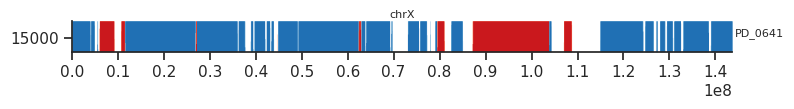

In [25]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.PGDP_ID
                                                                     == "PD_0641"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.4, aspect=20)

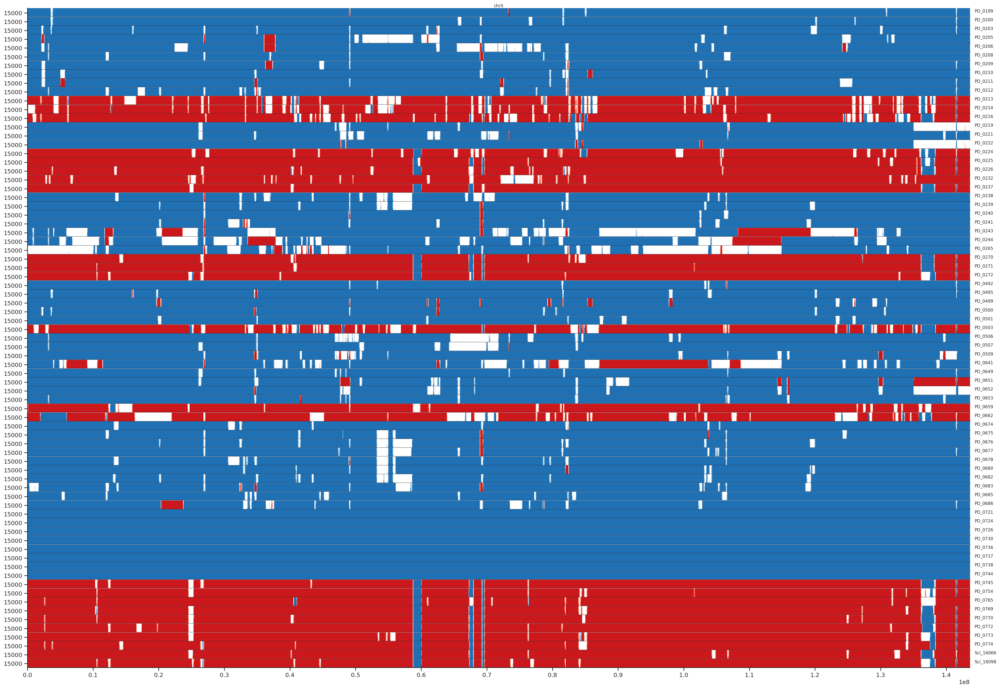

In [10]:
sub_chr = window_df.loc[window_df.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/ChrX_all_gen50.png", dpi=100, format="png")

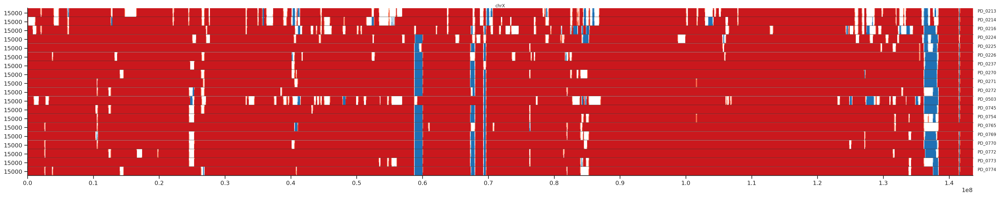

In [11]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/ChrX_yellow_tanzania_gen50.png", dpi=100, format="png")

In [12]:
east_cyno = length_df.loc[length_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
east_cyno.loc[(east_cyno.chrom == "chrX") & (east_cyno.pos > 5800000) & (east_cyno.pos < 5900000)]

,pos,end_pos,length,reference,n/s,individual,haplotype,chrom
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0213,0,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0213,1,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0214,0,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0214,1,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0216,0,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0216,1,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0224,0,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0224,1,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0225,0,chrX
77,5849687,5941346,91660,"Kindae, Zambia",0,PD_0225,1,chrX


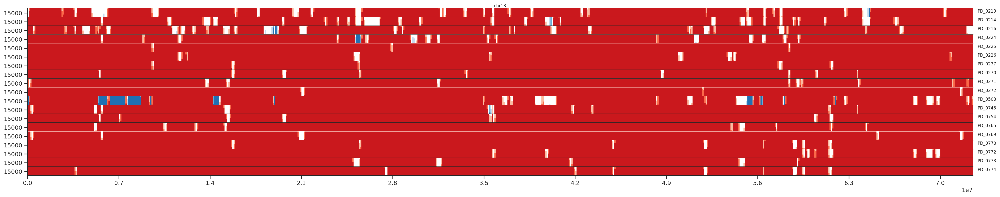

In [13]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chr18"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/Chr18_yellow_tanzania_gen50.png", dpi=100, format="png")

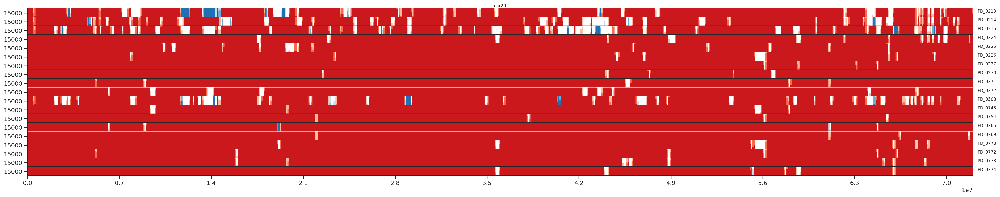

In [14]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Cynocephalus, Central Tanzania"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chr20"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/Chr20_yellow_tanzania_gen50.png", dpi=100, format="png")

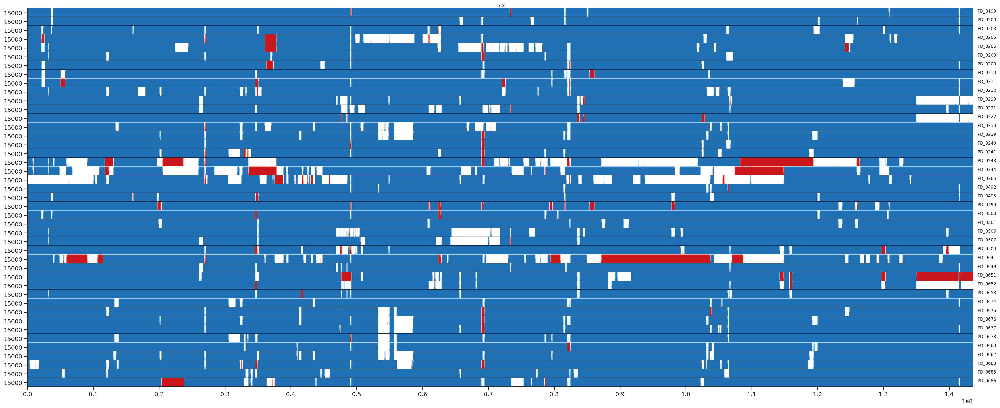

In [15]:
input_subset = window_df.loc[window_df.individual.isin(meta_data_samples.loc[meta_data_samples.C_origin
                                                                     == "Anubis, Tanzania"].PGDP_ID)]
sub_chr = input_subset.loc[input_subset.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/ChrX_anubis_tanzania_gen50.png", dpi=100, format="png")

In [16]:
meta_data_samples

,PGDP_ID,Provider_ID,Provider,Genus,Species,Origin,Sex,address,longitude,latitude,callset_index,C_origin
0,16066,16066_3130,Rogers,Papio,cynocephalus,"Mikumi, Tanzania",F,"Mikumi, Kilosa, Morogoro, Coastal Zone, Tanzania",36.977032,-7.404852,0,"Cynocephalus, Central Tanzania"
1,16098,16098_5026,Rogers,Papio,cynocephalus,"Mikumi, Tanzania",F,"Mikumi, Kilosa, Morogoro, Coastal Zone, Tanzania",36.977032,-7.404852,1,"Cynocephalus, Central Tanzania"
2,30877,30877_3426,James Else,Papio,anubis,"Aberdare, Kenya",M,"Aberdare National Park, Nyeri, Central Kenya, ...",36.712451,-0.410251,2,"Anubis, Kenya"
3,30977,30977_3373,James Else,Papio,anubis,"Aberdare, Kenya",F,"Aberdare National Park, Nyeri, Central Kenya, ...",36.712451,-0.410251,3,"Anubis, Kenya"
4,34449,34449_BZ11022,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,4,"Kindae, Zambia"
...,...,...,...,...,...,...,...,...,...,...,...,...
222,PD_0790,34418_BZ11065,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,222,"Kindae, Zambia"
223,PD_0791,34419_BZ11066,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,223,"Kindae, Zambia"
224,PD_0792,34420_BZ11067,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,224,"Kindae, Zambia"
225,PD_0793,34422_BZ11070,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",M,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,225,"Kindae, Zambia"


In [17]:
olive_IDs_subset = meta_data_samples.loc[meta_data_samples.Origin.isin(["Tarangire, Tanzania",
                                                                        "Serengeti, Tanzania",
                                                                        "Gombe, Tanzania"])].PGDP_ID
anubis_subset = window_df.loc[window_df.individual.isin(olive_IDs_subset)]

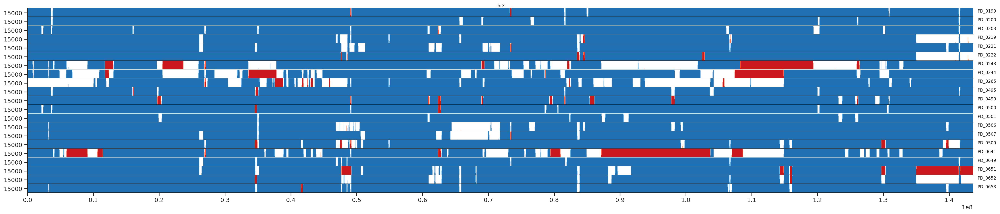

In [18]:
sub_chr = anubis_subset.loc[anubis_subset.chrom == "chrX"]
fig = horizonplot(sub_chr, 'norm_north', width=2, col='chrom', row='individual', size=0.3, aspect=100)
fig.savefig("../steps/paint_plots/ChrX_anubis_tanzania_subset_gen50.png", dpi=100, format="png")